### Student Information
Name: Nguyen Anh Loc - 阮英祿

Student ID: 109065421

GitHub ID: 72379649

---

### Instructions

1. First: do the **take home** exercises in the [DM2020-Lab1-Master Repo](https://github.com/fhcalderon87/DM2020-Lab1-Master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2020-Lab1-Master Repo](https://github.com/fhcalderon87/DM2020-Lab1-Master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy :'(, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/fhcalderon87/DM2020-Lab1-Master/blob/master/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (Oct. 22th 11:59 pm, Thursday)__. 

In [1]:
### Begin Assignment Below

### Table of Contents
**I. TAKE HOME Exercises**
- Prepocessing
- Exercise 2
    - Selection by label
    - Selection by position
    - Selection by callable
    - The `where()` and `mask()` method
    - The `query()` method
- Exercise 5
- Exercise 6
- Exercise 8
- Exercise 10
- Exercise 11
- Exercise 12
- Exercise 13
- Exercise 14
- Exercise 15
- Exercise 16

**II. New Dataset Processing Replication**
1. Data Preparation
2. Familiarizing with the Data
3. Data Mining using Pandas
- 3.1 Missing Values
- 3.2 Duplicate Data
4. Data Preprocessing
- 4.1 Sampling
- 4.2 Feature Creation
- 4.3 Feature Subset Selection
- 4.4 Dimensionality Reduction
- 4.5 Attribute Transformation / Aggregation
- 4.6 Discretization and Binarization
5. Data Exploration

**III. New Dataset Assignment**
1. Data Visualization
- 1.1 Wordcloud
    - Overall Wordcloud
    - Positive Scoring Wordcloud
    - Negative Scoring Wordcloud
- 1.2 Negative Frequency vs. Positive Frequency Scatter
- 1.3 Zipf’s Law Distribution for Word Frequencies
2. TF-IDF Features
3. Naive Bayes Classifier
- 3.1 TF-IDF Features
- 3.2 Word Frequency Features

**IV. How To Improve the Data Preprocessing**

***
***

# I. TAKE HOME Exercises

## Preprocessing

In [2]:
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

# most of certain library should be import here
from sklearn.datasets import fetch_20newsgroups
twenty_train = fetch_20newsgroups(subset='train', categories=categories, \
                                  shuffle=True, random_state=42)
import numpy as np
import pandas as pd
import helpers.data_mining_helpers as dmh
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

X.head()

,text
0,From: sd345@city.ac.uk (Michael Collier) Subje...
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...
4,From: stanly@grok11.columbiasc.ncr.com (stanly...


In [3]:
X['category'] = twenty_train.target
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))
print(X.info())
X.head(20)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2257 entries, 0 to 2256
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   text           2257 non-null   object
 1   category       2257 non-null   int64 
 2   category_name  2257 non-null   object
dtypes: int64(1), object(2)
memory usage: 53.0+ KB
None


,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med


## **<span style="color:red">Exercise 2:</span>**
Experiment with other querying techniques using pandas dataframes. Refer to their [documentation](https://pandas.pydata.org/pandas-docs/stable/indexing.html) for more information.

### - Selection by label

In [4]:
# select the first 10 row of dataset
X.loc[:9]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med


In [5]:
# select information in column 'text' and 'category_name' of the 1st 10 row of dataset
X.loc[:9,['text','category_name']]

,text,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,sci.med


### - Selection by position

In [6]:
# select the 10th row of dataset
X.iloc[:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med


In [7]:
# select information in column 'text' and 'category_name' of the 1st 10 row of dataset
X.iloc[:10,[0,2]]

,text,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,sci.med


In [8]:
# select dataset without the last column
X.iloc[:,:-1]

,text,category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3
...,...,...
2252,From: roos@Operoni.Helsinki.FI (Christophe Roo...,2
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2
2255,From: Dan Wallach <dwallach@cs.berkeley.edu> S...,2


### - Selection by callable

In [9]:
# select column 'text' of rows which have category = 3 and belong to the first 10 rows of dataset
X.iloc[:10][X.category == 3]

<ipython-input-9-04a24ae30980>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  X.iloc[:10][X.category == 3]


,text,category,category_name
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian


In [10]:
# select the first 10 rows with sender email starts by 'g'
X[X.text.str.startswith('From: g')].iloc[:10]

,text,category,category_name
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
21,From: gmiller@worldbank.org (Gene C. Miller) S...,0,alt.atheism
34,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
39,From: g9134255@wampyr.cc.uow.edu.au (Coronado ...,1,comp.graphics
42,From: gwang@magnus.acs.ohio-state.edu (Ge Wang...,1,comp.graphics
61,From: gifford@oasys.dt.navy.mil (Barbara Giffo...,3,soc.religion.christian
104,From: gt7122b@prism.gatech.edu (boundary) Subj...,3,soc.religion.christian
111,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
117,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
127,"From: gt7122b@prism.gatech.edu (boundary, the ...",3,soc.religion.christian


### - The `where()` and `mask()` method

In [11]:
# use the where() and mask() method to select the first 10 rows which have category < 3
X[X.where(X.category > 2).text.isna()].head(10)

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
11,From: amjad@eng.umd.edu (Amjad A Soomro) Subje...,1,comp.graphics
12,From: I3150101@dbstu1.rz.tu-bs.de (Benedikt Ro...,0,alt.atheism
13,Subject: So what is Maddi? From: madhaus@netco...,0,alt.atheism
14,From: sloan@cis.uab.edu (Kenneth Sloan) Subjec...,1,comp.graphics
15,From: Mike_Peredo@mindlink.bc.ca (Mike Peredo)...,1,comp.graphics


In [12]:
X[X.mask(X.category < 3).text.isna()].head(10)

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med
11,From: amjad@eng.umd.edu (Amjad A Soomro) Subje...,1,comp.graphics
12,From: I3150101@dbstu1.rz.tu-bs.de (Benedikt Ro...,0,alt.atheism
13,Subject: So what is Maddi? From: madhaus@netco...,0,alt.atheism
14,From: sloan@cis.uab.edu (Kenneth Sloan) Subjec...,1,comp.graphics
15,From: Mike_Peredo@mindlink.bc.ca (Mike Peredo)...,1,comp.graphics


### - The `query()` method

In [13]:
# create a column 'temp' to record the balance when the index of row is divided by 3
# then use query() method to select rows with the category value > the balance
X['temp'] = X.index % 3
X.query('category > temp')

,text,category,category_name,temp
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,0
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,2
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,0
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,1
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,2
...,...,...,...,...
2249,From: shellgate!llo@uu4.psi.com (Larry L. Over...,3,soc.religion.christian,2
2251,From: Mark-Tarbell@suite.com Subject: Amniocen...,2,sci.med,1
2253,From: mhollowa@ic.sunysb.edu (Michael Holloway...,2,sci.med,0
2254,From: sasghm@theseus.unx.sas.com (Gary Merrill...,2,sci.med,1


In [14]:
# use query() in 2 different ways to select rows with category = 0 or 3 and the category value >= the balance
X[X.category.isin([0,3])].query('category >= temp')

,text,category,category_name,temp
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,2
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,0
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,1
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,2
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,0
...,...,...,...,...
2230,From: news@cbnewsk.att.com Subject: Re: Bible ...,3,soc.religion.christian,1
2246,From: lmvec@westminster.ac.uk (William Hargrea...,3,soc.religion.christian,2
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian,0
2249,From: shellgate!llo@uu4.psi.com (Larry L. Over...,3,soc.religion.christian,2


In [15]:
X.query('category >= temp and category == [0,3]')

,text,category,category_name,temp
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,2
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,0
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,1
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,2
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,0
...,...,...,...,...
2230,From: news@cbnewsk.att.com Subject: Re: Bible ...,3,soc.religion.christian,1
2246,From: lmvec@westminster.ac.uk (William Hargrea...,3,soc.religion.christian,2
2247,From: daniels@math.ufl.edu (TV's Big Dealer) S...,3,soc.religion.christian,0
2249,From: shellgate!llo@uu4.psi.com (Larry L. Over...,3,soc.religion.christian,2


## **<span style="color:red">Exercise 5</span>** 
There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.   
$Hint$ :  why `.isnull()` didn't work?

In [16]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [17]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

**<span style="color:blue">Answer:</span>**
- There are many ways in which such invalid values as missing values or blank values can be generated. But the `.isnull()` command cannot detect all as usual.
- In the script above, there are 6 ways to create those missing values in `NA_dict`.
    - The `.isnull()` function just can detect 3 out of total 6, which include a numpy NaN (`np.nan`), technically not fill in and a null value defined by `None` keyword.
    - Other values in row id C, D and F are generated by key-in the keyword (`'NaN'`, `'None'` and `''`) literally. Therefore, the `.isnull()` command consider those values as string type in stead of `None` or `NaN` value.

## **<span style="color:red">Exercise 6:</span>**
Notice any changes to the `X` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

**<span style="color:blue">Answer:</span>**

Nothing changes because we create another dataframe `X_sample` for the sample, which did not impact dataset `X`.

## **<span style="color:red">Exercise 8:</span>**
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for. 

![alt txt](https://i.imgur.com/9eO431H.png)

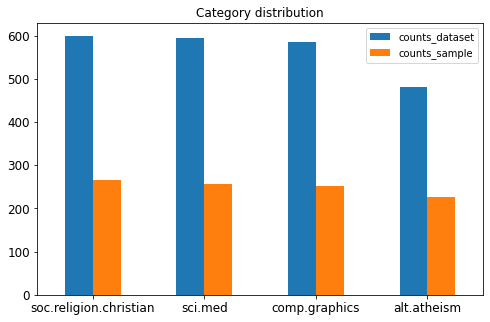

In [18]:
from matplotlib.pyplot import figure
X_sample = X.sample(n=1000) #random state

df1 = pd.DataFrame({'cat_name': X.category_name.value_counts().index
                    ,'counts': X.category_name.value_counts().values})

df2 = pd.DataFrame({'cat_name': X_sample.category_name.value_counts().index
                    ,'counts': X_sample.category_name.value_counts().values})

df = pd.merge(df1, df2, how='left', on='cat_name',suffixes=('_dataset', '_sample'))
df.set_index('cat_name', inplace=True)

df.plot.bar(title='Category distribution',rot = 0,fontsize = 12,figsize = (8,5))
plt.xlabel('')
plt.xticks(rotation=0)
plt.show()

## **<span style="color:red">Exercise 10:</span>**
We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [19]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)

arr = X_counts[0:5].toarray()

# fifth record
arr[4]

array([1, 0, 0, ..., 0, 0, 0])

In [20]:
# search for the position of the 1 in the fifth record
x = np.where(arr[4] == 1)
x

(array([    0,    37,   587,   677,  1490,  1540,  1742,  2203,  2521,
         4852,  5698,  5777,  6430,  7280,  8197,  8525,  8544,  9066,
         9067,  9925, 10481, 10874, 11498, 12731, 13239, 14095, 14309,
        14526, 14887, 15406, 15511, 15612, 15822, 16358, 16585, 16642,
        16703, 16916, 16926, 18363, 18551, 19382, 19383, 20253, 20770,
        20842, 20978, 21060, 21176, 23595, 23733, 23741, 23915, 26356,
        26570, 27031, 27352, 27997, 28091, 28771, 29610, 29785, 30068,
        30199, 30250, 31077, 31948, 32139, 32164, 32179, 32202, 32205,
        33741, 34790, 34935, 34982, 35350, 35638, 35648]),)

In [21]:
# the first 1 represents from the vocabulary
count_vect.get_feature_names()[x[0][0]]

'00'

In [22]:
# the second 1 represents from the vocabulary
count_vect.get_feature_names()[x[0][1]]

'01'

## **<span style="color:red">Exercise 11:</span>**
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

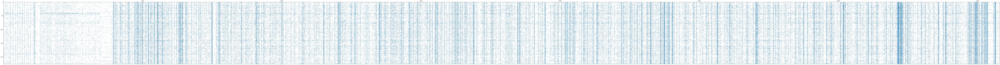

In [23]:
plt.figure(figsize=(200, 100))
plt.spy(X_counts,aspect='equal',markersize=1)
plt.show()

Above is the simple visualization of the term-document matrix of the vectorizer. The very left area of the plot is what the former heat-map shows us in the Lab 1 Master file (.ipynb). Overall, the term-document matrix is relatively sparse, especially the very left part.

`matplotlib.pyplot.spy` helps improve the efficiency because it visualizes the non-zero values of the array.

We can look into a particular area by adjusting the filter of `X_counts` as below.

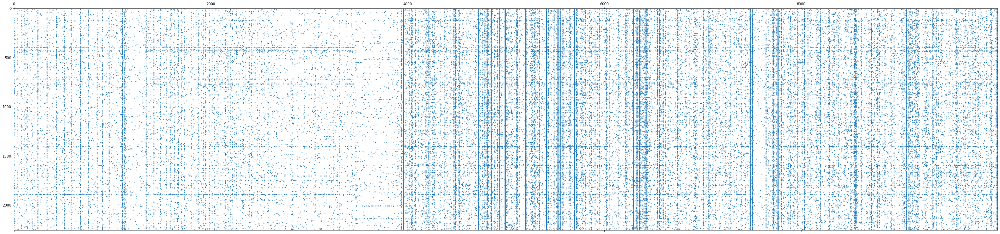

In [24]:
plt.figure(figsize=(50,50))
plt.spy(X_counts[:, 0:10000],aspect='equal',markersize=1)
plt.show() 

## **<span style="color:red">Exercise 12:</span>**
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

In [25]:
from sklearn.decomposition import PCA
X_reduced = PCA(n_components = 3).fit_transform(X_counts.toarray())

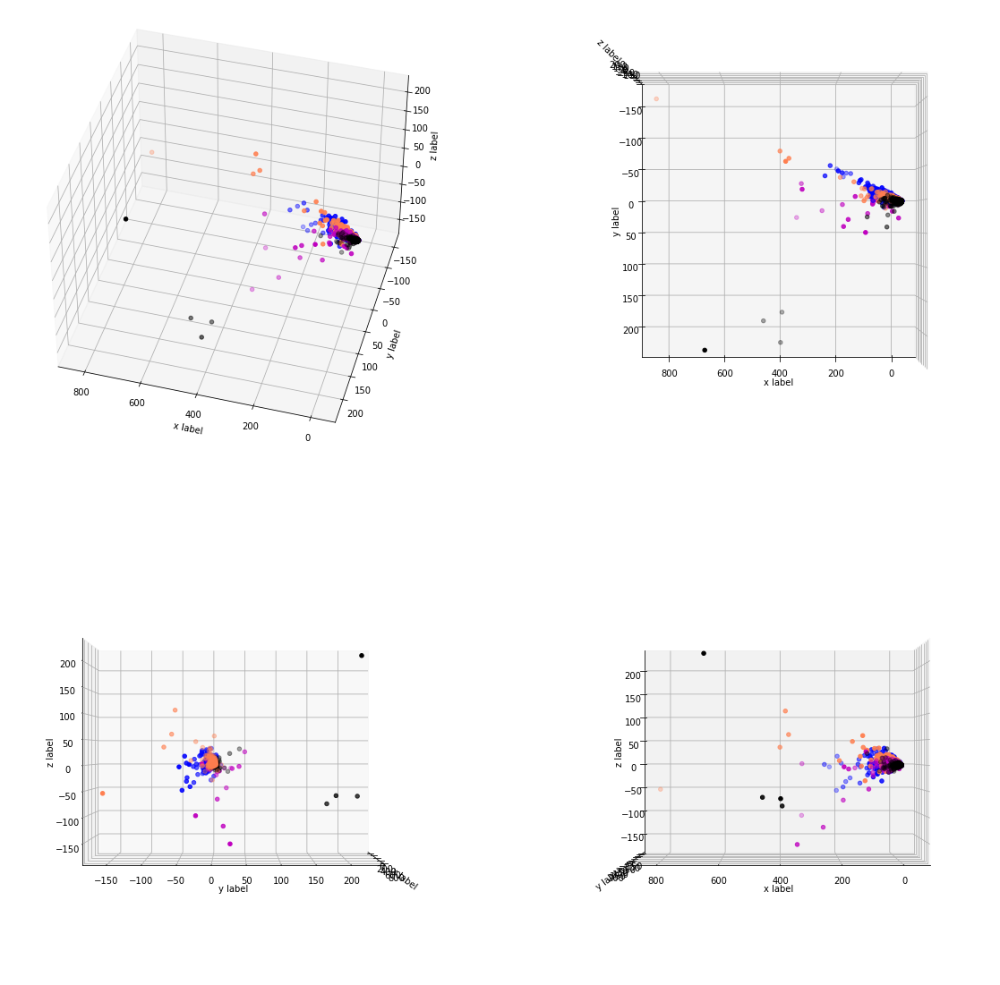

In [26]:
col = ['coral', 'blue', 'black', 'm']
el = [42, 90, 0, 0]
az = [105.5, 90, 0, 90]

# Plot data
from mpl_toolkits.mplot3d import Axes3D

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 20), 
                         subplot_kw=dict(projection='3d'))

for ax, x, y in zip(axes.flat, el, az):
    #ax = plt.figure(figsize=(10,10)).gca(projection='3d')

    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category].T[0]
        ys = X_reduced[X['category_name'] == category].T[1]
        zs = X_reduced[X['category_name'] == category].T[2]
   
        ax.scatter(xs, ys, zs, c = c, marker='o', cmap='coolwarm')

    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_xlabel('x label')
    ax.set_ylabel('y label')
    ax.set_zlabel('z label')

    # Set what angles we wannna see
    elev = x
    azim = y
    ax.view_init(elev, azim)
    
plt.show()

From the above angles, we can see a clearer grouping by category, which is not immediately clear from the 2D visualization.

## **<span style="color:red">Exercise 13:</span>**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [27]:
term_frequencies = []
for j in range(0,X_counts.shape[1]):
    term_frequencies.append(sum(X_counts[:,j].toarray()))
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

In [28]:
import plotly.offline as py
import plotly.graph_objects as go

x = ["term_"+str(i) for i in count_vect.get_feature_names()]
y = term_frequencies.tolist()

fig = go.Figure(data = [go.Bar(x=x[:100],y=y[:100])])
fig.show()


## **<span style="color:red">Exercise 14:</span>**
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise. 


In [29]:
cv1 = CountVectorizer(max_features=100)
X_cv1 = cv1.fit_transform(X.text)
term_freq_1 = []
for j in range(0,X_cv1.shape[1]):
    term_freq_1.append(sum(X_cv1[:,j].toarray()))
term_freq_1 = np.asarray(X_cv1.sum(axis=0))[0]

Using `CountVectorizer` with parameter `max_features` helps generate a set of vocabulary that should have the highest document-frequency, and lexicographically highest term would be kept in the case of equal frequencies.

In [30]:
X_counts.shape

(2257, 35788)

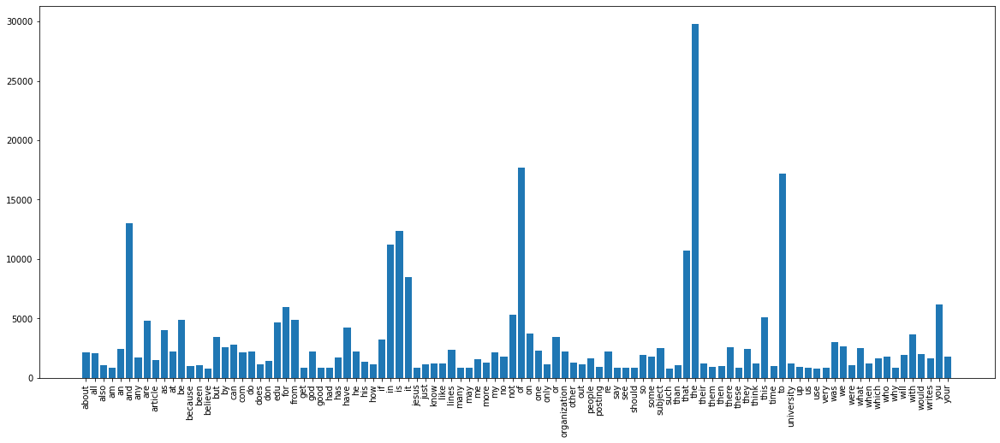

In [31]:
g_cv1 = pd.DataFrame()
g_cv1['term'] = cv1.get_feature_names()
g_cv1['counts'] = term_freq_1

plt.subplots(figsize=(20,8))
plt.bar(g_cv1.term, g_cv1.counts)
plt.xticks(rotation=90)
plt.show()

## **<span style="color:red">Exercise 15:</span>**
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

In [32]:
g=pd.DataFrame()
g['term'] = count_vect.get_feature_names()
g['counts'] = term_frequencies

term_sort = g.sort_values(by=['counts'],ascending=False)

term_sort['cum_counts'] = term_sort['counts'].cumsum()
term_sort['cum_ptg'] = term_sort['cum_counts']/term_sort['counts'].sum()

term_plot_50 = term_sort[term_sort['cum_ptg'] <= 0.5]
print('50% frequencies contributed by: ',round(100*term_plot_50.shape[0]/g.shape[0],2)
      ,'% out of total ',g.shape[0],' terms','\n\nSo let try to plot this sub-datasets!')

50% frequencies contributed by:  0.49 % out of total  35788  terms 

So let try to plot this sub-datasets!


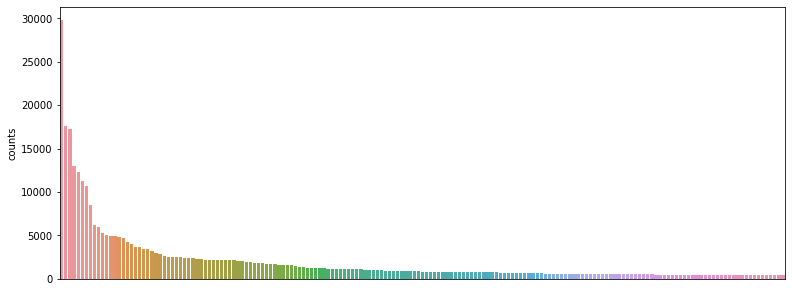

In [33]:
plt.subplots(figsize=(13,5))

g3 = sns.barplot(x=term_plot_50.term, y=term_plot_50.counts)
g3.set(xticklabels=[])
g3.set(xlabel=None)
g3.tick_params(bottom=False)

plt.show()

## **<span style="color:red">Exercise 16:</span>**
Try to generate the binarization using the `category_name` column instead. Does it work?

In [34]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category_name)
mlb.classes_
X['bin_category'] = mlb.transform(X['category_name']).tolist()
X[0:9]

,text,category,category_name,temp,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,0,"[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,1,"[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,2,"[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,0,"[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,1,"[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,2,"[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,0,"[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,1,"[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,2,"[0, 0, 1, 0]"


It still works with the same results.

***
***

# II. New Dataset Processing Replication

## 1. Data Preparation

In [35]:
import glob

path = r'sentiment_labelled_sentences' # use your path
all_files = glob.glob(path + '/*_labelled.txt')
df_from_each_file = (pd.read_csv(f, sep='\t', header=None) for f in all_files)
df = pd.concat(df_from_each_file, ignore_index=True)

df.columns = ['sentence','score']
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2748 entries, 0 to 2747
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   sentence  2748 non-null   object
 1   score     2748 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 43.1+ KB


Because the dataset is into pandas dataframe already, next step should be familiarizing with the data instead of converting step as the original script of Lab 1 Master.

## 2. Familiarizing with the Data

This section will be processed with some simplifier queries.

In [36]:
df.head(10)

,sentence,score
0,So there is no way for me to plug it in here i...,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more...,0
4,The mic is great.,1
5,I have to jiggle the plug to get it to line up...,0
6,If you have several dozen or several hundred c...,0
7,If you are Razr owner...you must have this!,1
8,"Needless to say, I wasted my money.",0
9,What a waste of money and time!.,0


In [37]:
df.tail(10)

,sentence,score
2738,"The opening sequence of this gem is a classic,...",1
2739,Fans of the genre will be in heaven.,1
2740,Lange had become a great actress.,1
2741,It looked like a wonderful story.,1
2742,I never walked out of a movie faster.,0
2743,I just got bored watching Jessice Lange take h...,0
2744,"Unfortunately, any virtue in this film's produ...",0
2745,"In a word, it is embarrassing.",0
2746,Exceptionally bad!,0
2747,All in all its an insult to one's intelligence...,0


In [38]:
df.groupby('score').count()

,sentence
score,
0,1362
1,1386


## 3. Data Mining using Pandas

### 3.1 Missing Values

In [39]:
df.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentence,score
0,The amoung of missing records is:,The amoung of missing records is:
1,0,0


In [40]:
df.dropna(inplace=True)

In [41]:
df.shape

(2748, 2)

There is no null value and the length of dataset is not changed (no NaN value).

In [42]:
df_temp = df.copy()
df_temp['sentence_lowercase'] = df_temp.sentence.str.lower()
df_temp[df_temp.sentence_lowercase.isin(['nan','','none'])].shape

(0, 3)

there is no 'NaN' or 'None' or blankspace '' inputted

### 3.2 Duplicate Data

In [43]:
print('# duplicated rows: ', sum(df.duplicated()))
df[df.duplicated()]

# duplicated rows:  17


,sentence,score
285,Great phone!.,1
407,Works great.,1
524,Works great!.,1
543,Don't buy this product.,0
744,If you like a loud buzzing to override all you...,0
748,Does not fit.,0
778,This is a great deal.,1
792,Great Phone.,1
892,Excellent product for the price.,1
896,Great phone.,1


In [44]:
sum(df.duplicated('sentence'))

17

In [45]:
df_clean = df.drop_duplicates(keep=False, inplace=False) #remove duplicates and record the new dataset
len(df_clean)

2714

## 4.  Data Preprocessing

### 4.1 Sampling

In [46]:
df_sample = df_clean.sample(n=1000)
df_sample.shape

(1000, 2)

In [47]:
df_sample.head()

,sentence,score
622,This is a great product..... sure beats using ...,1
1133,The management is rude.,0
1514,Everything was perfect the night we were in.,1
357,"First off the reception sucks, I have never ha...",0
956,Just reading on the specs alone makes you say ...,1


The side-by-side bar graph will be plotted below as an improvement of the original process.

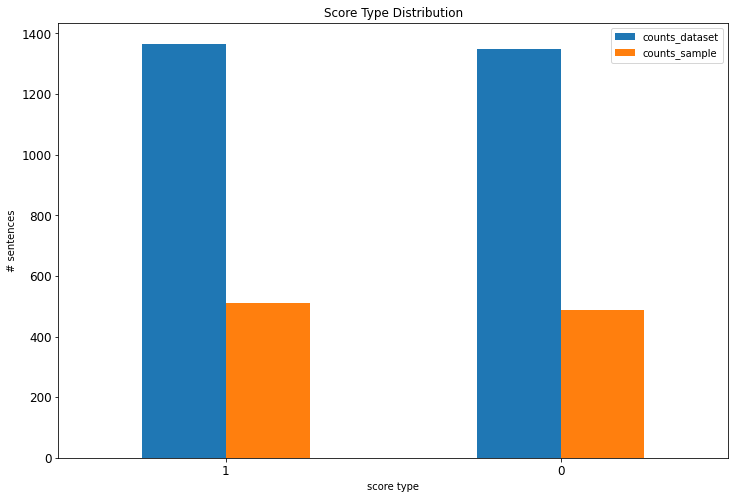

In [48]:
score_count_full = pd.DataFrame({'score_type': df_clean.score.value_counts().index
                    ,'counts': df_clean.score.value_counts().values})

score_count_sample = pd.DataFrame({'score_type': df_sample.score.value_counts().index
                    ,'counts': df_sample.score.value_counts().values})

score_count_merge = pd.merge(score_count_full, score_count_sample
                             ,how='left', on='score_type',suffixes=('_dataset', '_sample'))
score_count_merge.set_index('score_type', inplace=True)

score_count_merge.plot.bar(title='Score Type Distribution'
                           ,rot = 0, fontsize = 12, figsize = (12,8))
plt.ylabel('# sentences')
plt.xlabel('score type')
plt.xticks(rotation=0)
plt.show()

### 4.2 Feature Creation

In [49]:
import nltk
df_clean['unigrams'] = df_clean['sentence'].apply(lambda x: dmh.tokenize_text(x))
df_clean.head()

<ipython-input-49-ab2a38d44793>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,sentence,score,unigrams
0,So there is no way for me to plug it in here i...,0,"[So, there, is, no, way, for, me, to, plug, it..."
1,"Good case, Excellent value.",1,"[Good, case, ,, Excellent, value, .]"
2,Great for the jawbone.,1,"[Great, for, the, jawbone, .]"
3,Tied to charger for conversations lasting more...,0,"[Tied, to, charger, for, conversations, lastin..."
4,The mic is great.,1,"[The, mic, is, great, .]"


In [50]:
df_clean.unigrams[0:4]

0    [So, there, is, no, way, for, me, to, plug, it...
1                 [Good, case, ,, Excellent, value, .]
2                        [Great, for, the, jawbone, .]
3    [Tied, to, charger, for, conversations, lastin...
Name: unigrams, dtype: object

In [51]:
list(df_clean.unigrams[0:1])

[['So',
  'there',
  'is',
  'no',
  'way',
  'for',
  'me',
  'to',
  'plug',
  'it',
  'in',
  'here',
  'in',
  'the',
  'US',
  'unless',
  'I',
  'go',
  'by',
  'a',
  'converter',
  '.']]

### 4.3 Feature Subset Selection

In [52]:
cv = CountVectorizer()
df_cv = cv.fit_transform(df_clean.sentence)
df_cv.shape

(2714, 5153)

In [53]:
cv.get_feature_names()[0:10]

['00', '10', '100', '11', '12', '13', '15', '15g', '15pm', '17']

In [54]:
df_cv[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

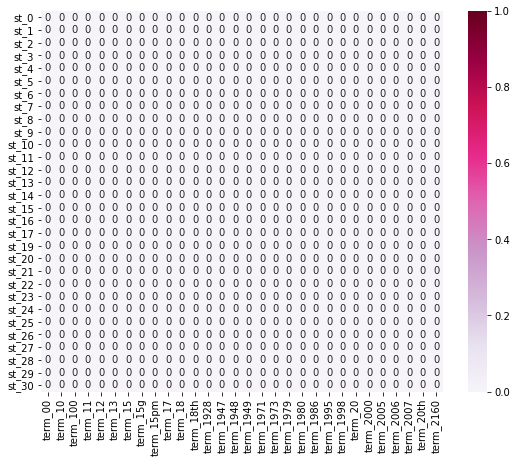

In [55]:
plot_x = ["term_"+str(i) for i in cv.get_feature_names()[0:30]]
plot_y = ["st_"+ str(i) for i in list(df_clean.index)[0:30]]
plot_z = df_cv[0:30, 0:30].toarray()

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

### 4.4 Dimensionality Reduction

In [56]:
df_reduced = PCA(n_components = 2).fit_transform(df_cv.toarray())
df_reduced.shape

(2714, 2)

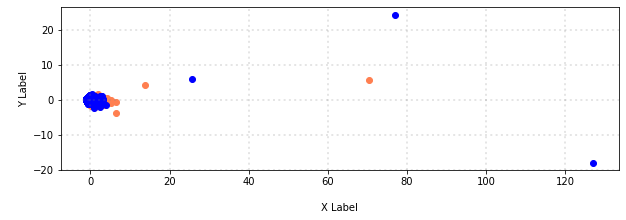

In [57]:
col = ['coral', 'blue']

# plot
fig = plt.figure(figsize = (10,3))
ax = fig.subplots()

for c, score in zip(col, [1,0]):
    xs = df_reduced[df_clean['score'] == score].T[0]
    ys = df_reduced[df_clean['score'] == score].T[1]
   
    ax.scatter(xs, ys, c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')

plt.show()

In [58]:
df_reduced_2 = PCA(n_components = 3).fit_transform(df_cv.toarray())
df_reduced_2.shape

(2714, 3)

### 4.5 Attribute Transformation / Aggregation

In [59]:
df_term_freq = []
for j in range(0,df_cv.shape[1]):
    df_term_freq.append(sum(df_cv[:,j].toarray()))

In [60]:
df_term_freq = np.asarray(df_cv.sum(axis=0))[0]

In [61]:
df_term_freq[0]

1

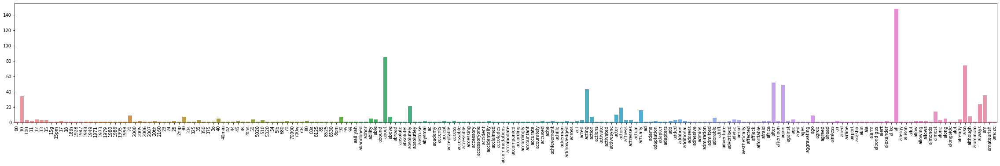

In [62]:
plt.subplots(figsize=(40, 5))
fplot = sns.barplot(x=cv.get_feature_names()[:200], 
            y=df_term_freq[:200])
fplot.set_xticklabels(cv.get_feature_names()[:200], rotation = 90);

In [63]:
import math
df_term_freq_log = [math.log(i) for i in df_term_freq]

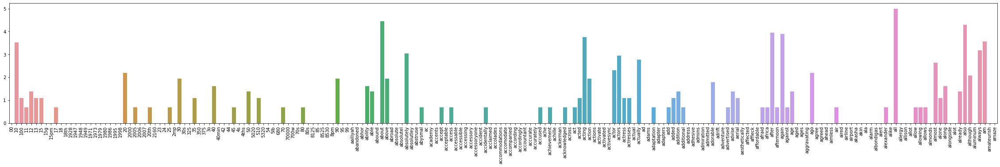

In [64]:
plt.subplots(figsize=(40, 5))
fplot = sns.barplot(x=cv.get_feature_names()[:200],
                y=df_term_freq_log[:200])
fplot.set_xticklabels(cv.get_feature_names()[:200], rotation = 90);

### 4.6 Discretization and Binarization

In [65]:
df_mlb = preprocessing.LabelBinarizer()

In [66]:
df_mlb.fit(df_clean.score)

LabelBinarizer()

In [67]:
df_mlb.classes_

array([0, 1])

In [68]:
df_clean['bin_score'] = df_mlb.transform(df_clean['score']).tolist()

<ipython-input-68-305bb4520bca>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [69]:
df_clean.head()

,sentence,score,unigrams,bin_score
0,So there is no way for me to plug it in here i...,0,"[So, there, is, no, way, for, me, to, plug, it...",[0]
1,"Good case, Excellent value.",1,"[Good, case, ,, Excellent, value, .]",[1]
2,Great for the jawbone.,1,"[Great, for, the, jawbone, .]",[1]
3,Tied to charger for conversations lasting more...,0,"[Tied, to, charger, for, conversations, lastin...",[0]
4,The mic is great.,1,"[The, mic, is, great, .]",[1]


The score is binary already, actually we don't need to conduct the binarization.

# 5. Data Exploration

In [70]:
document_to_transform_1 = []
random_record_1 = df_clean.iloc[50]
random_record_1 = random_record_1['sentence']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = df_clean.iloc[100]
random_record_2 = random_record_2['sentence']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = df_clean.iloc[150]
random_record_3 = random_record_3['sentence']
document_to_transform_3.append(random_record_3)

In [71]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['good protection and does not make phone too bulky.']
['Buyer Beware, you could flush money right down the toilet.']
['Audio Quality is poor, very poor.']


In [72]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = cv.transform(document_to_transform_1)
document_vector_count_2 = cv.transform(document_to_transform_2)
document_vector_count_3 = cv.transform(document_to_transform_3)

# Binarize vecors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [73]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})

Cosine Similarity using count bw 1 and 2: 0.000000
Cosine Similarity using count bw 1 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000


***
***

# III. New Dataset Assignment

## 1. Data Visualization

### 1.1 Wordcloud

#### Overall Wordcloud

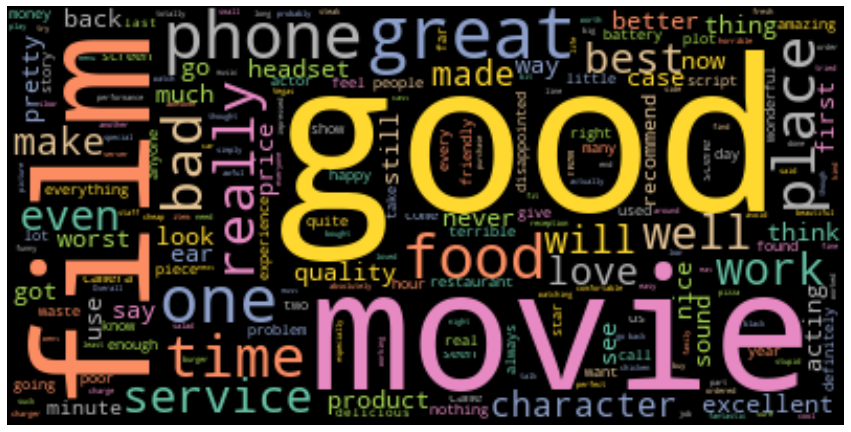

In [74]:
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

textt = " ".join(review for review in df_clean.sentence)
wordcloud = WordCloud(colormap='Set2').generate(textt)

plt.subplots(figsize=(15, 13))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#### Positive Scoring Wordcloud

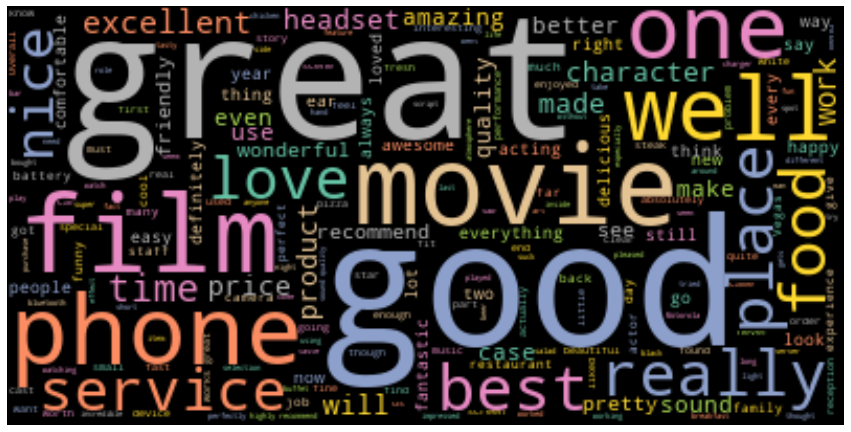

In [75]:
textt = " ".join(review for review in df_clean.sentence[df_clean.score == 1])
wordcloud = WordCloud(colormap='Set2').generate(textt)

plt.subplots(figsize=(15, 13))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

#### Negative Scoring Wordcloud

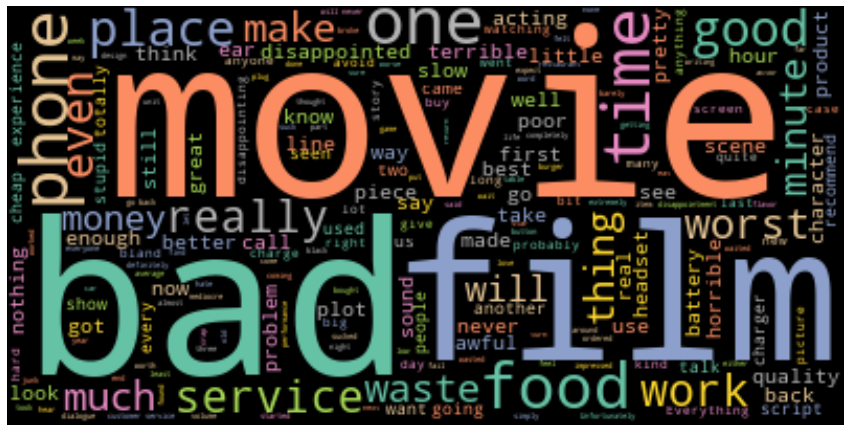

In [76]:
textt = " ".join(review for review in df_clean.sentence[df_clean.score == 0])
wordcloud = WordCloud(colormap='Set2').generate(textt)

plt.subplots(figsize=(15, 13))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

We can recognize a remarkable difference between 3 wordclouds above with some words really relating to types of scoring. But there still remains some neutral words appearing in all 3 wordclouds with a higher frequency.

### 1.2 Negative Frequency vs. Positive Frequency Scatter

In [77]:
neg_doc_matrix = cv.transform(df_clean.sentence[df_clean.score == 0])
pos_doc_matrix = cv.transform(df_clean.sentence[df_clean.score == 1])
neg_tf = np.sum(neg_doc_matrix,axis=0)
pos_tf = np.sum(pos_doc_matrix,axis=0)
neg = np.squeeze(np.asarray(neg_tf))
pos = np.squeeze(np.asarray(pos_tf))
term_freq_df = pd.DataFrame([neg,pos],columns=cv.get_feature_names()).transpose()
term_freq_df.columns = ['negative','positive']
term_freq_df.shape

(5153, 2)

Text(0.5, 1.0, 'Negative Frequency vs. Positive Frequency')

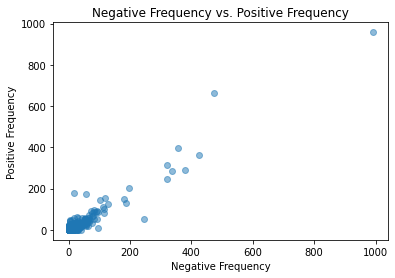

In [78]:
plt.figure()
scatter_plt = sns.regplot(x = 'negative', y = 'positive'
                          ,fit_reg=False, scatter_kws={'alpha':0.5}
                          ,data=term_freq_df)
plt.ylabel('Positive Frequency')
plt.xlabel('Negative Frequency')
plt.title('Negative Frequency vs. Positive Frequency')

Most of the words are below 200 on both X-axis and Y-axis so we cannot see meaningful relations between negative and positive frequency. So we can try with other kinds of scatter chart, such as positive/negative rate with Harmonic Mean or CDF Harmonic Mean. 

### 1.3 Zipf’s Law Distribution for Word Frequencies

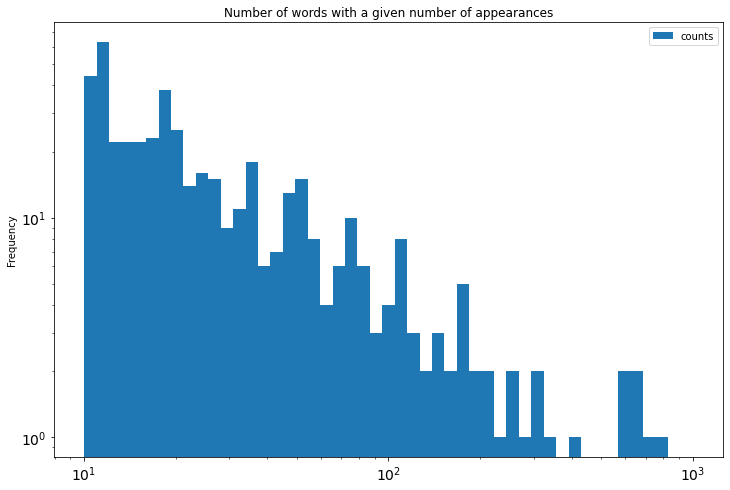

In [79]:
word_freq = pd.DataFrame()
word_freq['term'] = cv.get_feature_names()
word_freq['counts'] = df_term_freq

word_freq.plot(kind='hist',
                       bins=np.logspace(1,3,50),
                       loglog=True,
                       title='Number of words with a given number of appearances',
                       fontsize=14,figsize=(12,8))
plt.show()

The plot doesn't show the completely clean curve. It requires to do a cleaning process to get a more meaningful collection of words with their frequencies being more similar to Zipf’s distribution.

## 2. TF-IDF Features

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfvec = TfidfVectorizer()
df_tfvec = tfvec.fit_transform(df_clean.sentence)
tfvec.get_feature_names()[0:10]

['00', '10', '100', '11', '12', '13', '15', '15g', '15pm', '17']

In [81]:
df_tfvec.shape

(2714, 5153)

In [82]:
df_tfvec[0:5, 0:100].toarray()

array([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.  

We can't compare the accuracy score of both methods because we didn't separate the dataset into training set and testing set.

## 3. Naive Bayes Classifier

### 3.1 TF-IDF Features

In [83]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve

df_train,df_test,score_train,score_test = train_test_split(df_tfvec,df_clean.score,test_size=0.3)

tf_bnb = MultinomialNB()
tf_bnb.fit(df_train, score_train)
print('accuracy score: ', tf_bnb.score(df_test, score_test),'\n')

accuracy score:  0.8147239263803681 



### 3.2 Word Frequency Features

In [84]:
dfcv_train,dfcv_test,score_cv_train,score_cv_test = train_test_split(df_cv,df_clean.score,test_size=0.3)

# we use multinomial Naive Bayes as it is useful to model feature vectors.
cv_bnb = MultinomialNB()
cv_bnb.fit(dfcv_train, score_cv_train)
print('accuracy score: ', cv_bnb.score(dfcv_test, score_cv_test),'\n')

accuracy score:  0.807361963190184 



Below is ROC Curve Comparison chart before giving some comments.

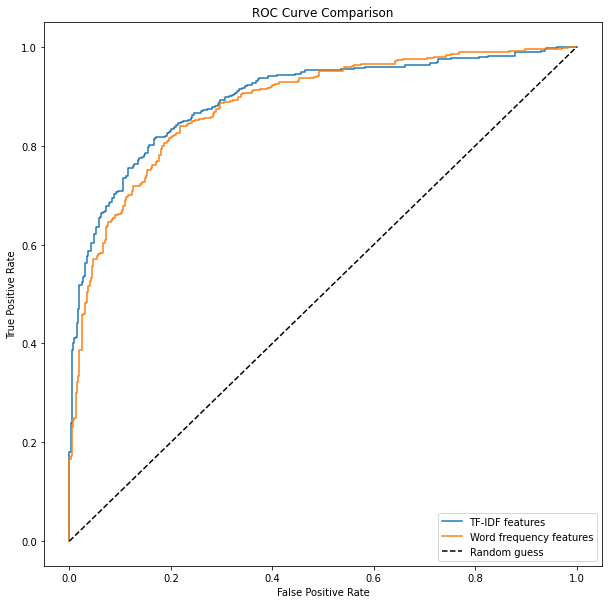

In [85]:
stf_score = tf_bnb.predict_proba(df_test)
scv_score = cv_bnb.predict_proba(dfcv_test)

plt.subplots(figsize=(10, 10))
fpr_tf, tpr_tf, thresholds_tf = roc_curve(score_test, stf_score[:, 1])
fpr_cv, tpr_cv, thresholds_cv = roc_curve(score_cv_test, scv_score[:, 1])

plt.plot(fpr_tf, tpr_tf, label='TF-IDF features')
plt.plot(fpr_cv, tpr_cv, label='Word frequency features')
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
plt.title('ROC Curve Comparison')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.show()

It is difficult to point out the classifier with which feature subset selection method is better than the other one. Because the two classifiers have similar accuracy and Area Under the Curve (AUC).

The important point is that both ROC Curve are not really close to 1, the classifiers can be better than random guessing, but are still not very good at minimizing false negatives and true negatives.

# IV. How To Improve the Data Preprocessing

1. **Sampling step:** we should visualize by side-by-side barchart to compare efficiently. Also, uncertain bar chart and uncertain ranked lists to double check if the sample data is representative with error in mind.
2. **Stop Words:** need to remove from vectorizer model in feature subset selection step. Because those are the most commonly occuring words which are not relevant in the context of the data and do not contribute any deeper meaning to the phrase (e.g. `'the'`, `'with'`, `'and'` contain no sentiment).
3. **Normalization:** to ensure that words written in different ways but same meaning will be treated equally (e.g. `'see ya'` and `'see you'`).
4. **Negation handling:*** Apostrophes connecting words are used everywhere, especially in public reviews, such as `"ain't"`,`"'em"`,`"'til"`,... So we should convert those words into standard lexicons to maintain uniform structure. The text will then follow the rules of context free grammar and helps avoids any word-sense disambiguation.
5. **Lemmatization:** to find the base or dictionary form of the word known as the lemma. This process also does identify the words with part-of-speech tagging considering nouns, verbs, adjectives and adverbs by taking into account the context of the word.
6. Do more meaningful visualizations. Then we can figure out more insightful patterns, e.g. in the negative scoring wordcloud, some words like `'bad'` or `'film'` are being used negatively. So we can try to combine these tokens together as `'bad film'`.
7. Need to separate the dataset into training set and testing set, then we are able to compare the accuracy between feature extraction methods.